# Unified SAM + Visual Encoder + Object Tracking Pipeline

This notebook provides a unified interface for:
- **SAM**: SAM 1 or SAM 2 segmentation
- **Visual Encoders**: DINOv2 or NaRadIO
- **Captions**: Optional Florence-2 descriptions
- **Zero-shot**: Optional NaRadIO category classification
- **Matching**: Greedy or Hungarian algorithm for object tracking
- **Metrics**: Unsupervised quality evaluation

## 1. Imports

In [10]:
import sys
from pathlib import Path
from tqdm.auto import tqdm

import torch
import numpy as np
np.random.seed(0xDEADBEEF)
import matplotlib.pyplot as plt
from PIL import Image

# Add src to path
src_dir = Path.cwd()
if str(src_dir) not in sys.path:
    sys.path.insert(0, str(src_dir))

# Import our modules
from vizenc_utils.visualization import (show_anns, visualize_masks_with_descriptions,
                                 visualize_object_tracking_with_metrics)
from vizenc_utils.matching import greedy_match_objects, optimal_match_objects
from vizenc_utils.metrics import compute_unsupervised_metrics
from vizenc_utils.tracking import assign_track_ids, get_track_summary
from vizenc_utils.anchors import (create_anchor_db, update_anchors, 
                           get_anchor_summary, export_anchors_for_graph)
from encoders.florence import load_florence_model
from encoders.dinov2 import load_dinov2_model
from encoders.naradio import load_naradio_encoder
from segmentation.sam import init_sam
from processing import process_masks_with_features, filter_masks

# Device selection
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

if device.type == "cuda":
    torch.autocast("cuda", dtype=torch.float16).__enter__()

Using device: cuda


## 2. Configuration

Customize your pipeline here:

In [11]:
# ========== PROJECT PATHS ==========
projectDir = Path.cwd().parent
dataDir = projectDir / "data/scand_spot_cafe-2/output_frames"

# ========== SAM CONFIGURATION ==========
SAM_CONFIG = {
    'version': 'sam1',  # 'sam1' or 'sam2'
    'checkpoint_path': "/mnt/vol0/weights/sam/sam_vit_h_4b8939.pth",
    'model_type': 'vit_h',  # SAM 1 only: 'vit_h', 'vit_l', 'vit_b'
    'points_per_side': 8,   # Number of grid points per side
    'pred_iou_thresh': 0.95,  # IoU threshold for mask quality
}

# ========== ENCODER CONFIGURATION ==========
ENCODER_CONFIG = {
    'type': 'naradio',  # 'dinov2' or 'naradio'
    
    # DINOv2 settings
    'dinov2_model': 'facebook/dinov2-base',
    
    # NaRadIO settings
    'naradio_version': 'radio_v2.5-b',  # 'radio_v2.5-b', 'radio_v2.5-l', 'radio_v2.5-g'
    'naradio_lang_model': 'siglip',  # 'clip' or 'siglip'
    'naradio_resolution': (512, 512),
}

# ========== FLORENCE-2 CONFIGURATION ==========
FLORENCE_CONFIG = {
    'use_florence': True,  # Enable Florence-2 captions
    'model_name': 'microsoft/Florence-2-large-ft',
}

# ========== ZERO-SHOT CONFIGURATION (NaRadIO only) ==========
ZERO_SHOT_CONFIG = {
    'use_zero_shot': True,  # Enable NaRadIO zero-shot classification
    'labels': [
        "person", "building", "tree", "grass", "sky", "ground",
        "ceiling", "floor"
        "column", "statue", "bench", "wall", "window", "door",
        "car", "bicycle", "road", "path", "water", "fountain",
        "pedestrian", "person", "human", "walker", "man", "shadow"
    ]
}

# ========== FILTERING CONFIGURATION ==========
FILTER_CONFIG = {
    'filtering': True,              # Enable/disable filtering
    'excluded_categories': {        # Categories to remove
        "pedestrian", "person", "human", "walker", "man", "woman",
        "shadow", "people", "child", "kid"
    },
    'min_mask_ratio': 0.1,         # Minimum 10% of image area
}

# ========== PROCESSING CONFIGURATION ==========
PROCESSING_CONFIG = {
    'use_batch': False,  # Batch processing for embeddings
    'batch_size': 8,
}

# ========== MATCHING CONFIGURATION ==========
MATCHING_CONFIG = {
    'algorithm': 'hungarian',  # 'greedy' or 'hungarian'
    'threshold': 0.7,  # Similarity threshold
}

# ========== ANCHOR CONFIGURATION ==========
ANCHOR_CONFIG = {
    'enabled': True,           # Enable anchor-based tracking
    'averaging_method': 'mean',  # 'mean' or 'ema'
    'ema_alpha': 0.3,          # EMA alpha (0-1, only used if method='ema')
    'threshold': 0.7,          # Similarity threshold for anchor matching
}

# ========== DATA CONFIGURATION ==========
DATA_CONFIG = {
    'start_frame': 4,    # Start processing from this frame index
    'max_frames': 6,     # Maximum number of frames to process
}

print("Configuration loaded!")
print(f"  SAM: {SAM_CONFIG['version']}")
print(f"  Encoder: {ENCODER_CONFIG['type']}")
print(f"  Florence-2: {FLORENCE_CONFIG['use_florence']}")
print(f"  Zero-shot: {ZERO_SHOT_CONFIG['use_zero_shot']}")
print(f"  Filtering: {FILTER_CONFIG['filtering']} (min_ratio={FILTER_CONFIG['min_mask_ratio']})")
print(f"  Matching: {MATCHING_CONFIG['algorithm']}")
print(f"  Anchors: {ANCHOR_CONFIG['enabled']} ({ANCHOR_CONFIG['averaging_method'].upper()})")
print(f"  Frames: {DATA_CONFIG['start_frame']} to {DATA_CONFIG['start_frame'] + DATA_CONFIG['max_frames'] - 1}")

Configuration loaded!
  SAM: sam1
  Encoder: naradio
  Florence-2: True
  Zero-shot: True
  Filtering: True (min_ratio=0.1)
  Matching: hungarian
  Anchors: True (MEAN)
  Frames: 4 to 9


## 3. Model Initialization

In [12]:
# Initialize SAM
print("Loading SAM...")
mask_generator = init_sam(
    projectDir,
    version=SAM_CONFIG['version'],
    checkpoint_path=SAM_CONFIG['checkpoint_path'],
    model_type=SAM_CONFIG.get('model_type', 'vit_h'),
    points_per_side=SAM_CONFIG.get('points_per_side', 32),
    pred_iou_thresh=SAM_CONFIG.get('pred_iou_thresh', 0.88),
    device=str(device)
)
print("SAM loaded!")

Loading SAM...


/home/denis_fatykhov/Projects/vizEnc/segment-anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


SAM loaded!


In [13]:
# Initialize Florence-2 (if enabled)
florence_model, florence_processor = None, None
if FLORENCE_CONFIG['use_florence']:
    print("Loading Florence-2...")
    florence_model, florence_processor = load_florence_model(
        model_name=FLORENCE_CONFIG['model_name'],
        device=str(device),
        dtype=torch.float16
    )
    print("Florence-2 loaded!")

Loading Florence-2...


<unknown>:515: SyntaxWarning: invalid escape sequence '\d'


Florence-2 loaded!


In [14]:
# Initialize Visual Encoder
print(f"Loading {ENCODER_CONFIG['type'].upper()} encoder...")

if ENCODER_CONFIG['type'] == 'dinov2':
    visual_encoder, visual_processor = load_dinov2_model(
        model_name=ENCODER_CONFIG['dinov2_model'],
        device=str(device)
    )
    visual_device = device
    
elif ENCODER_CONFIG['type'] == 'naradio':
    visual_encoder = load_naradio_encoder(
        projectDir,
        input_resolution=ENCODER_CONFIG['naradio_resolution'],
        model_version=ENCODER_CONFIG['naradio_version'],
        lang_model=ENCODER_CONFIG['naradio_lang_model'],
        device=str(device)
    )
    visual_processor = None  # NaRadIO doesn't use separate processor
    visual_device = device
    
else:
    raise ValueError(f"Unknown encoder type: {ENCODER_CONFIG['type']}")

print(f"{ENCODER_CONFIG['type'].upper()} encoder loaded!")

Loading NARADIO encoder...


Using cache found in /home/denis_fatykhov/.cache/torch/hub/NVlabs_RADIO_main


NARADIO encoder loaded!


## 4. Frame Processing

In [15]:
# Load frame paths
frames = sorted(dataDir.glob("frame_*.png"))
# frames = sorted(dataDir.glob("*.jpg"))
print(f"Found {len(frames)} frames")

Found 33 frames


Processing frames 4 to 9 (total: 6 frames)
Anchor tracking: ENABLED

Processing frame 4: frame_000036_t7.200.png


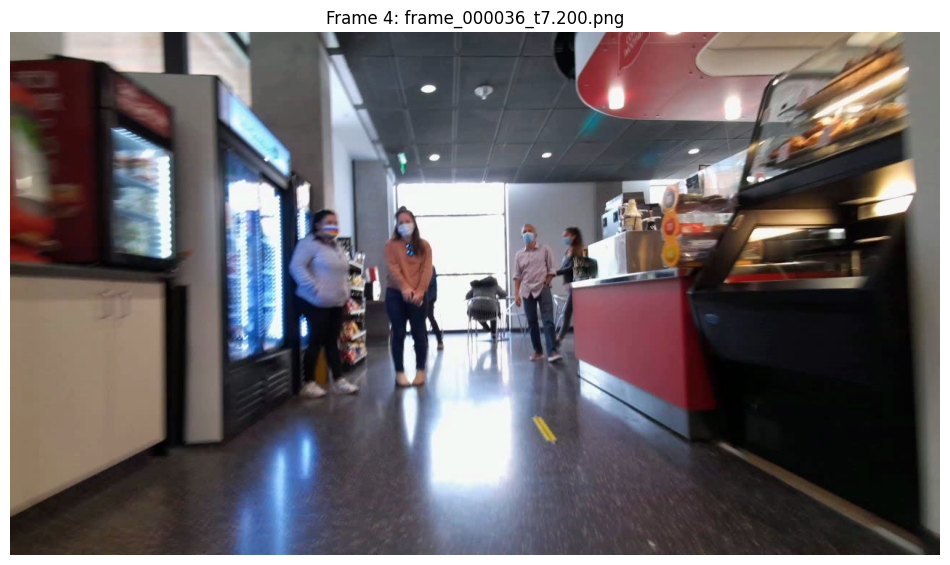

Generating masks...
Generated 32 masks


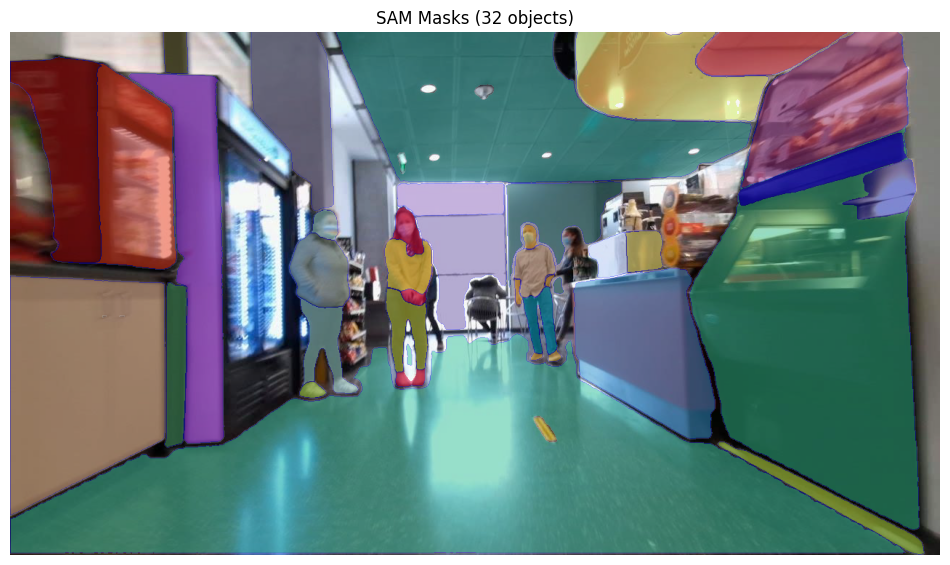

Generating descriptions...


  0%|          | 0/32 [00:00<?, ?it/s]

W0128 17:55:10.948000 139334518028096 torch/fx/experimental/symbolic_shapes.py:4449] [0/1] yindex is not in var_ranges, defaulting to unknown range.


Extracting embeddings...


  0%|          | 0/32 [00:00<?, ?it/s]

Filtering: 32 -> 3 masks (removed 16 by category, 13 by size)


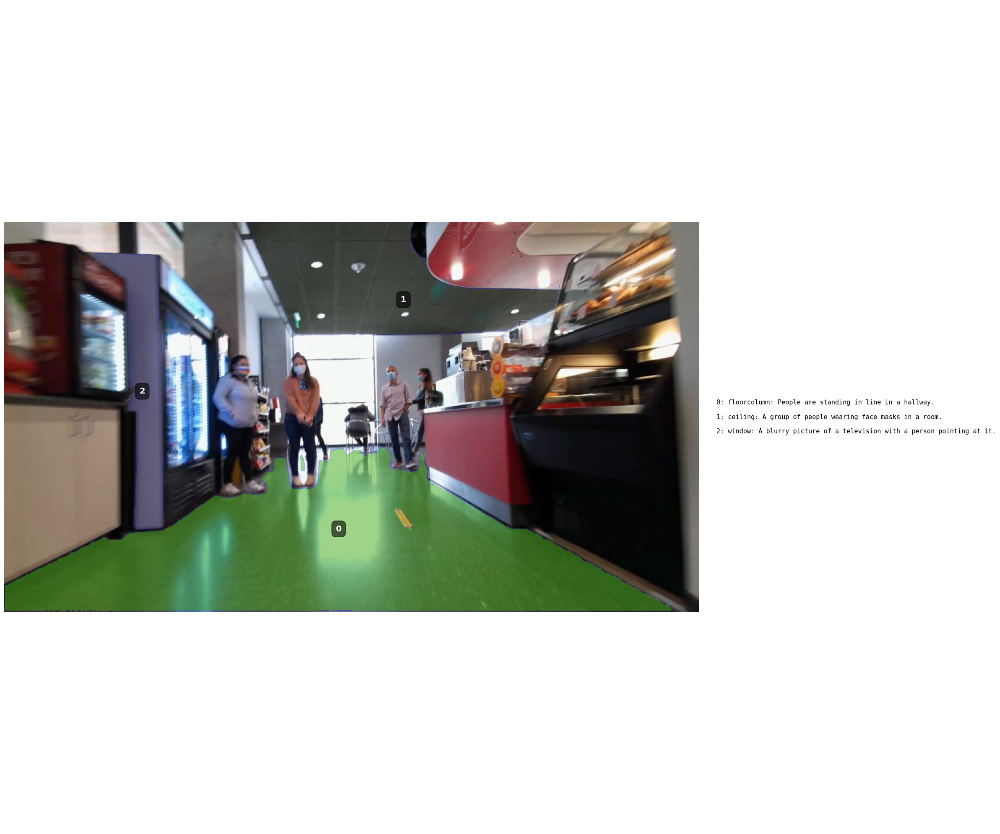


First frame: 3 anchors initialized

Processing frame 5: frame_000037_t7.400.png


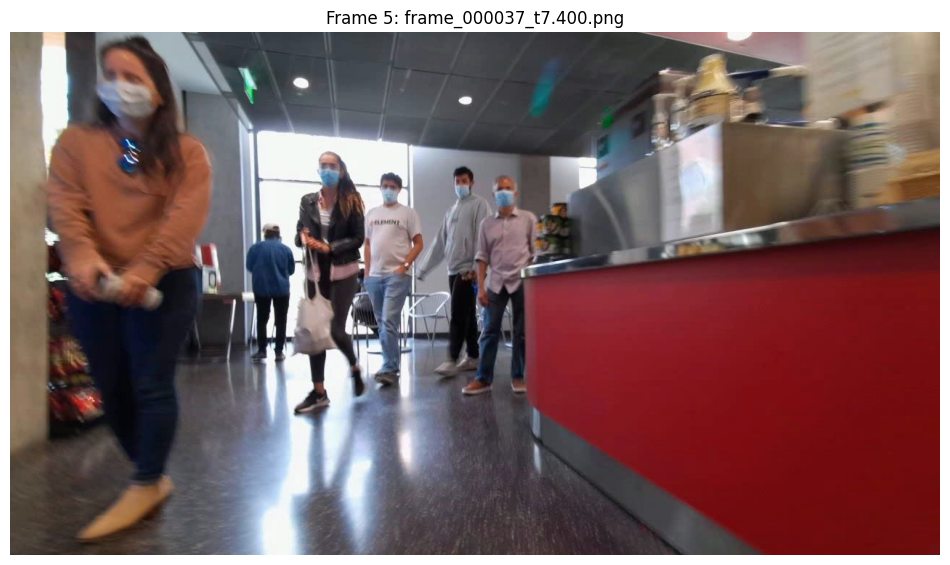

Generating masks...
Generated 17 masks


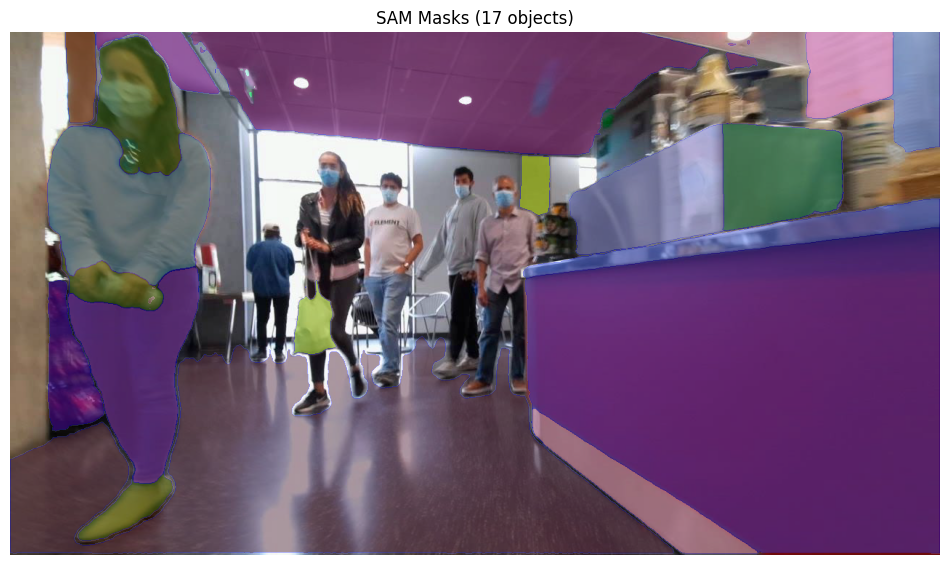

Generating descriptions...


  0%|          | 0/17 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/17 [00:00<?, ?it/s]

Filtering: 17 -> 3 masks (removed 5 by category, 9 by size)


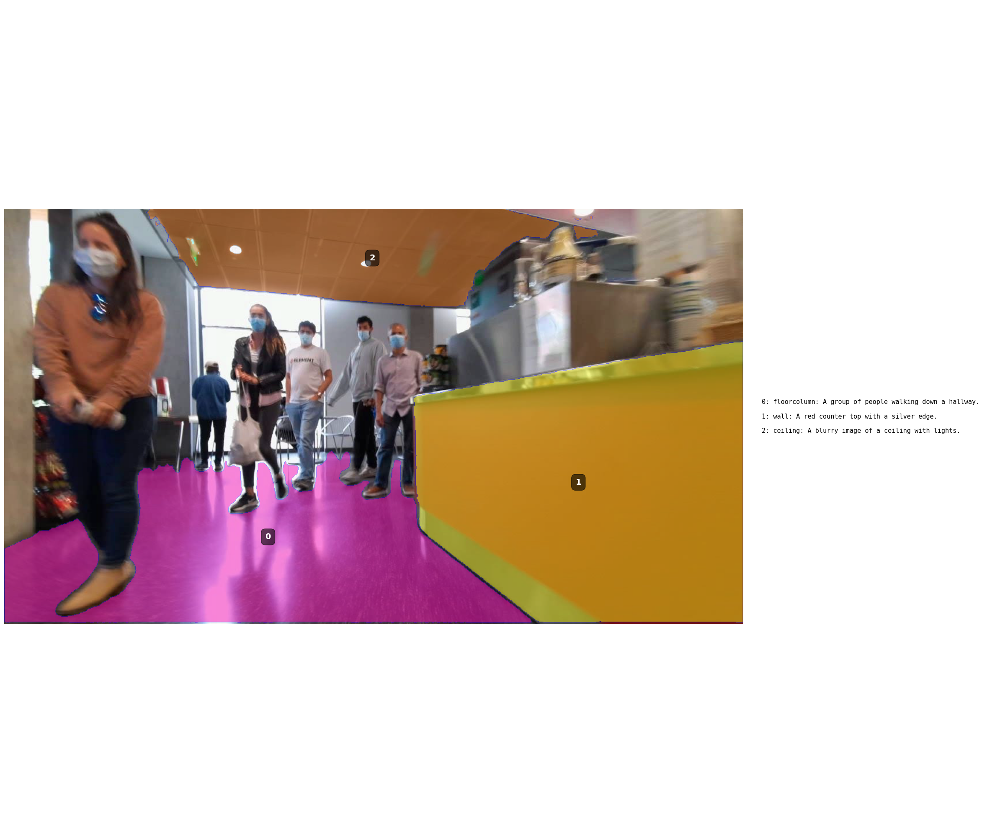


Matching: 2 pairs, Anchors: 2

Processing frame 6: frame_000038_t7.600.png


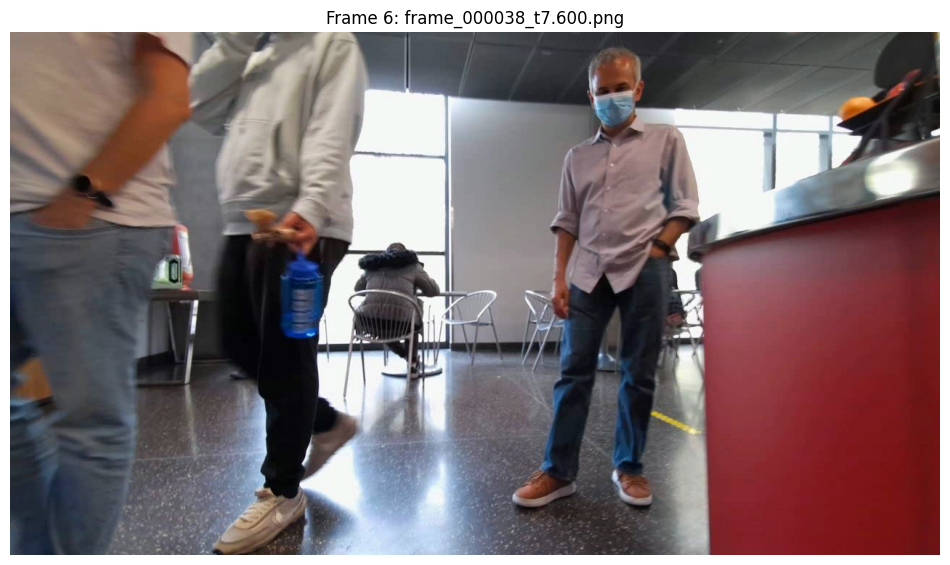

Generating masks...
Generated 19 masks


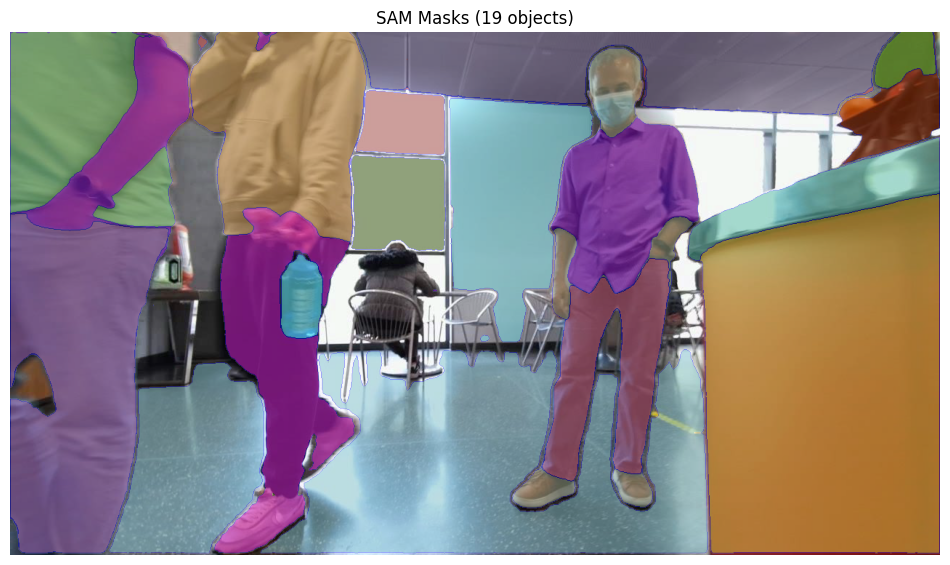

Generating descriptions...


  0%|          | 0/19 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/19 [00:00<?, ?it/s]

Filtering: 19 -> 1 masks (removed 15 by category, 3 by size)


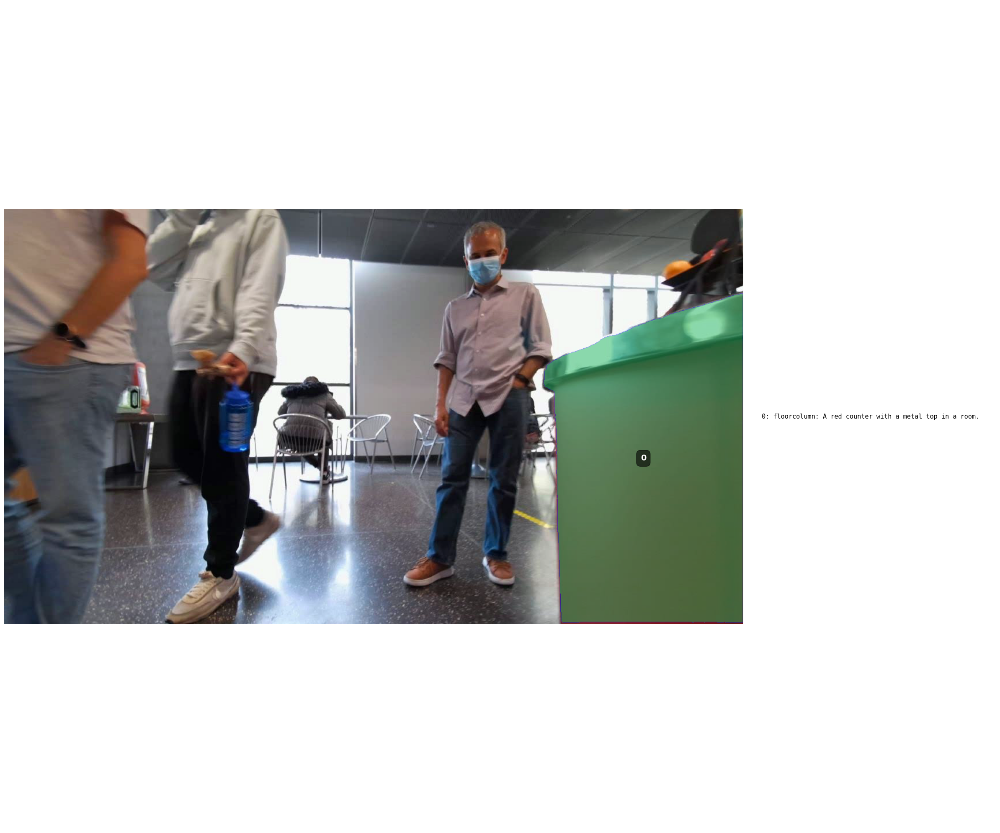


Matching: 1 pairs, Anchors: 2

Processing frame 7: frame_000039_t7.800.png


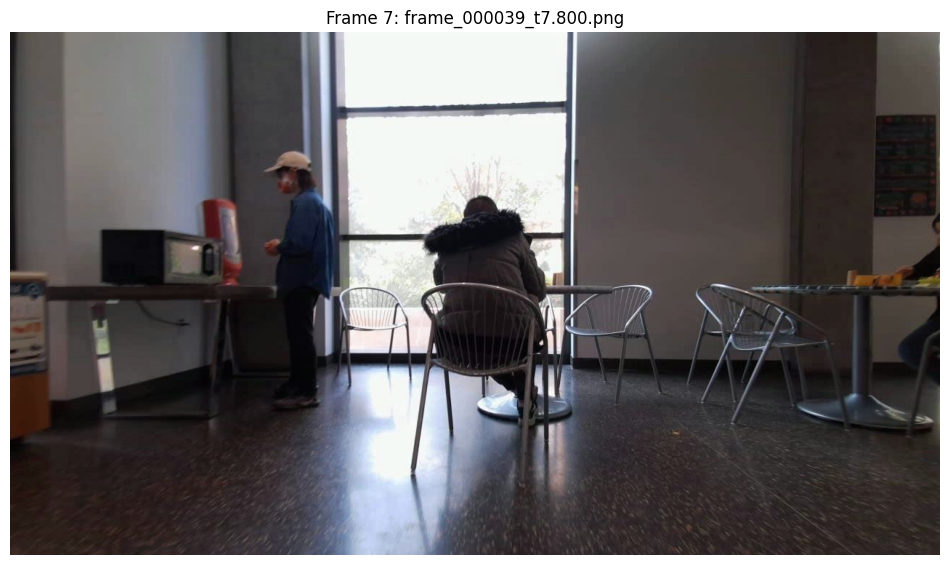

Generating masks...
Generated 19 masks


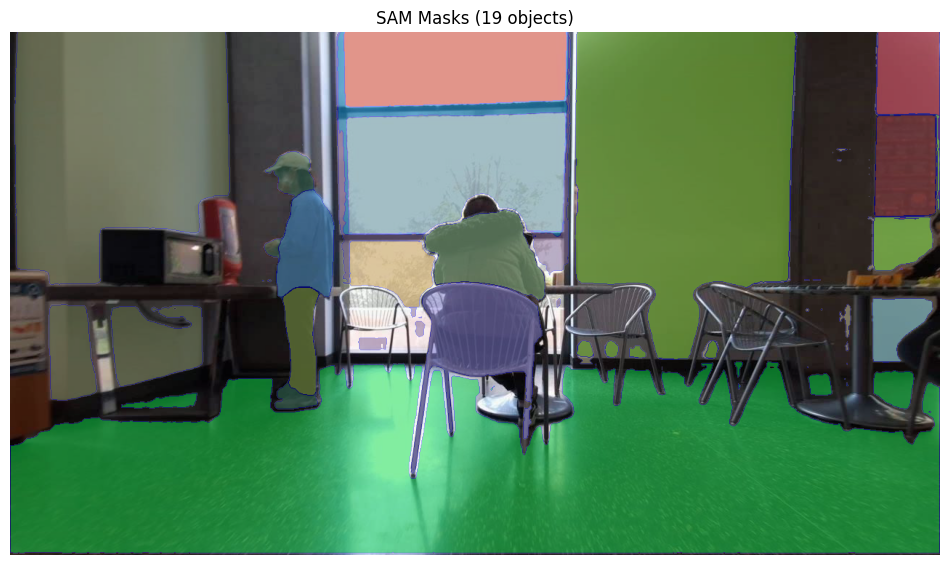

Generating descriptions...


  0%|          | 0/19 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/19 [00:00<?, ?it/s]

Filtering: 19 -> 4 masks (removed 11 by category, 4 by size)


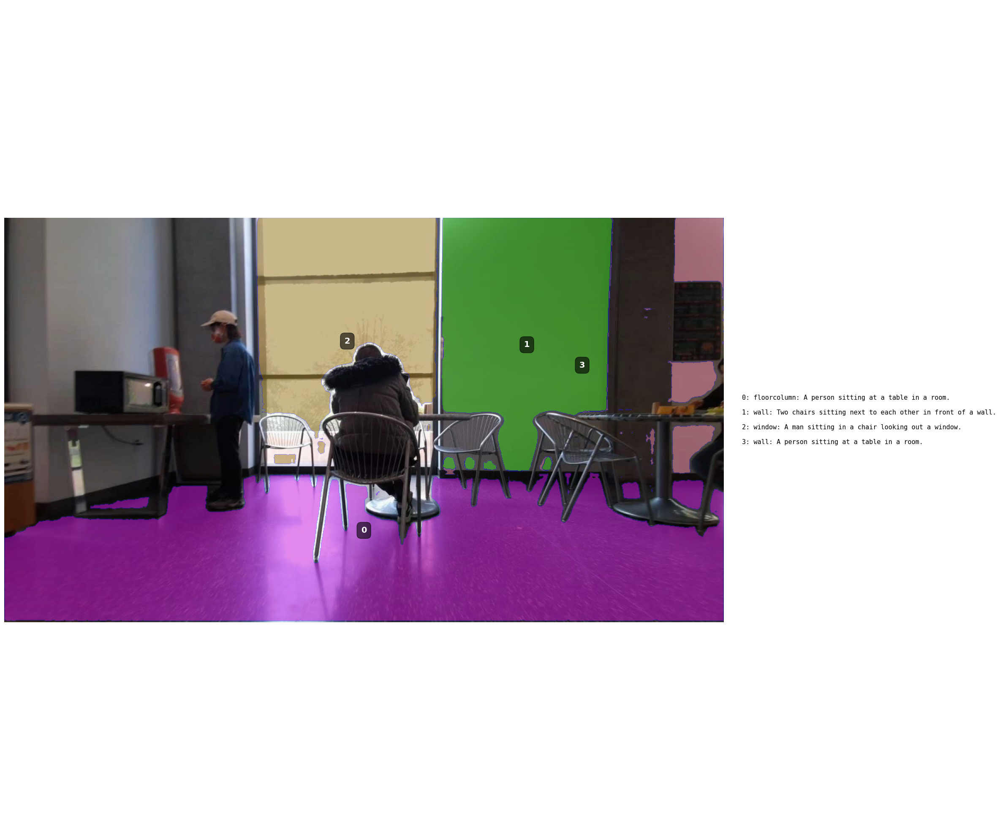


Matching: 1 pairs, Anchors: 3

Processing frame 8: frame_000040_t8.000.png


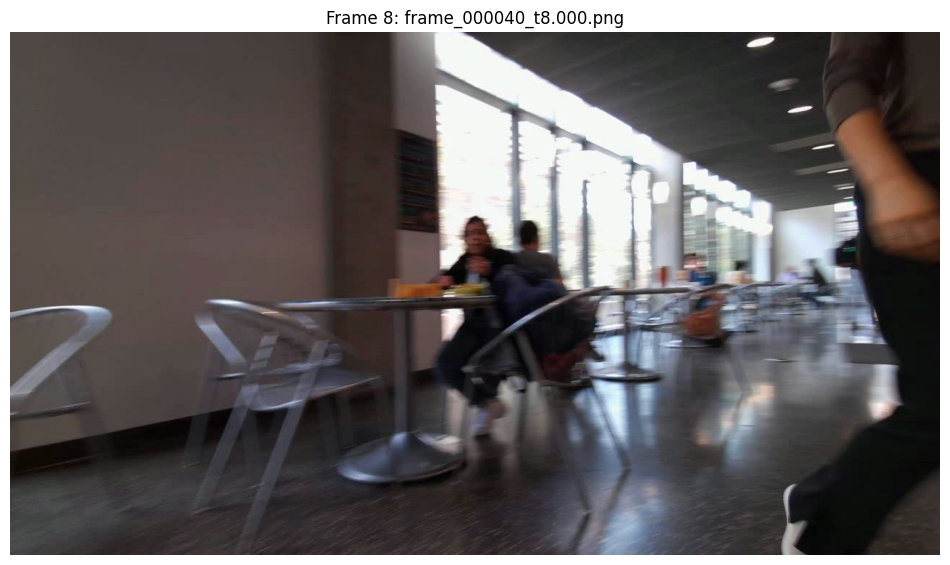

Generating masks...
Generated 11 masks


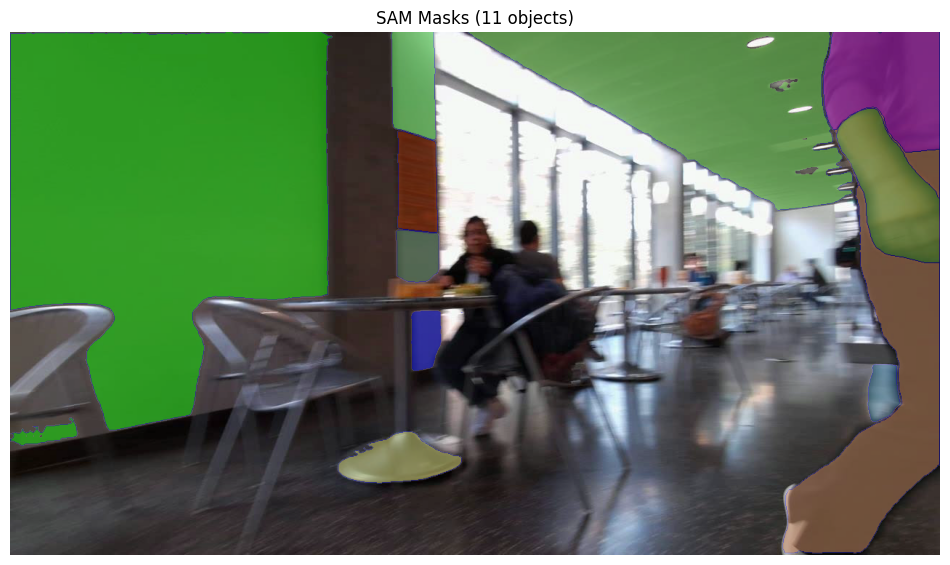

Generating descriptions...


  0%|          | 0/11 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/11 [00:00<?, ?it/s]

Filtering: 11 -> 2 masks (removed 4 by category, 5 by size)


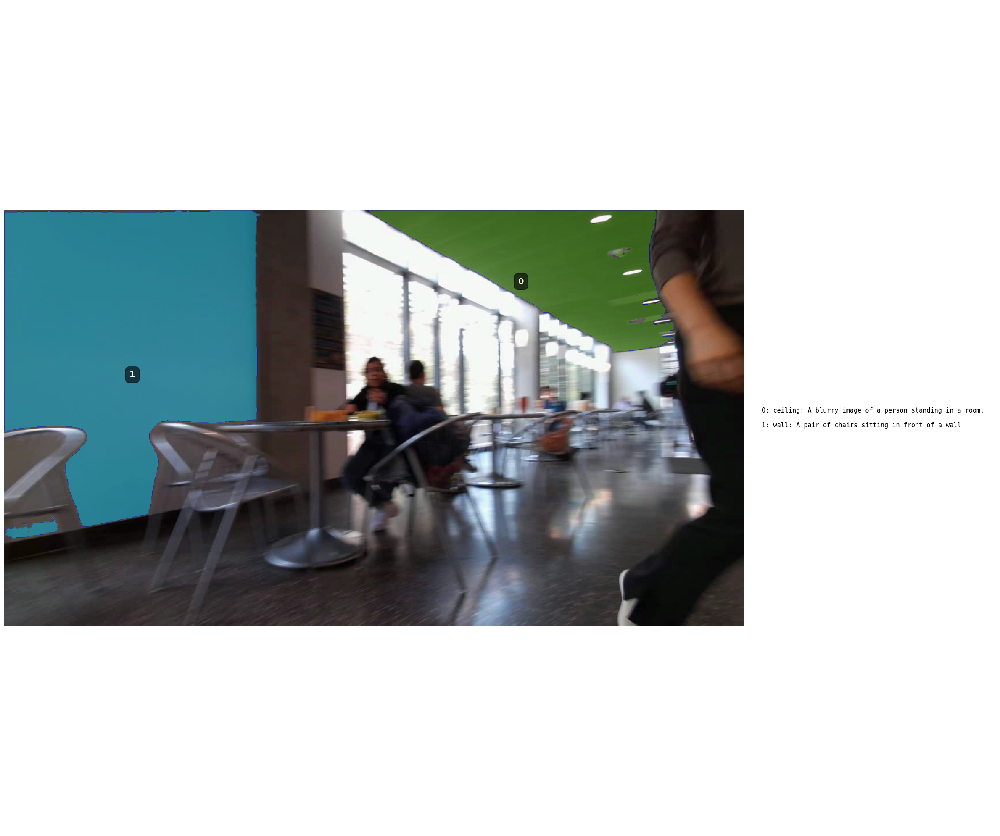


Matching: 1 pairs, Anchors: 3

Processing frame 9: frame_000041_t8.200.png


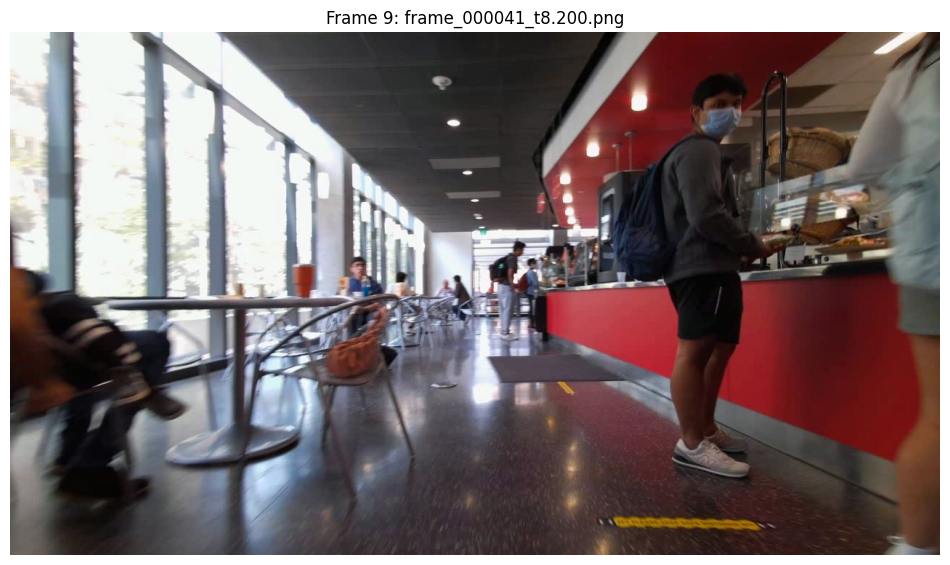

Generating masks...
Generated 17 masks


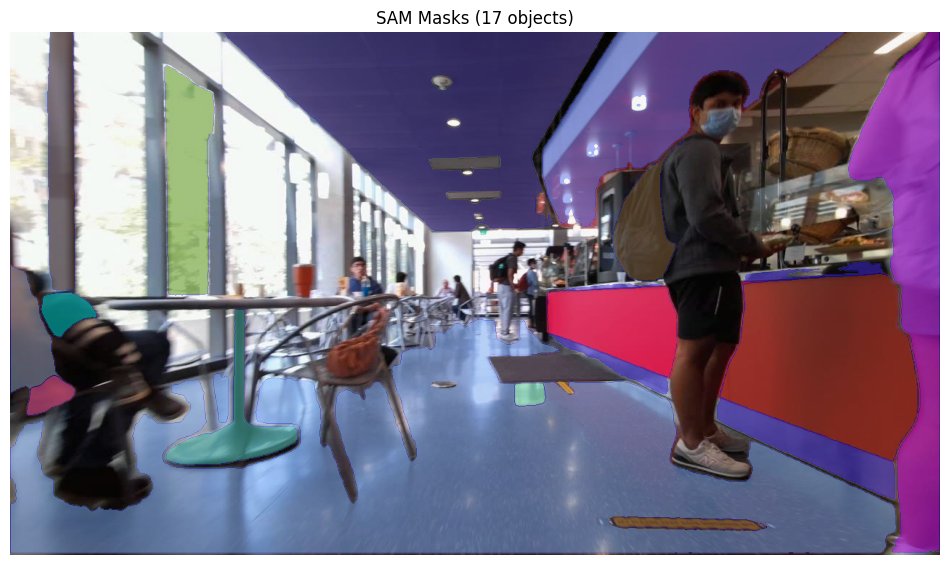

Generating descriptions...


  0%|          | 0/17 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/17 [00:00<?, ?it/s]

Filtering: 17 -> 2 masks (removed 5 by category, 10 by size)


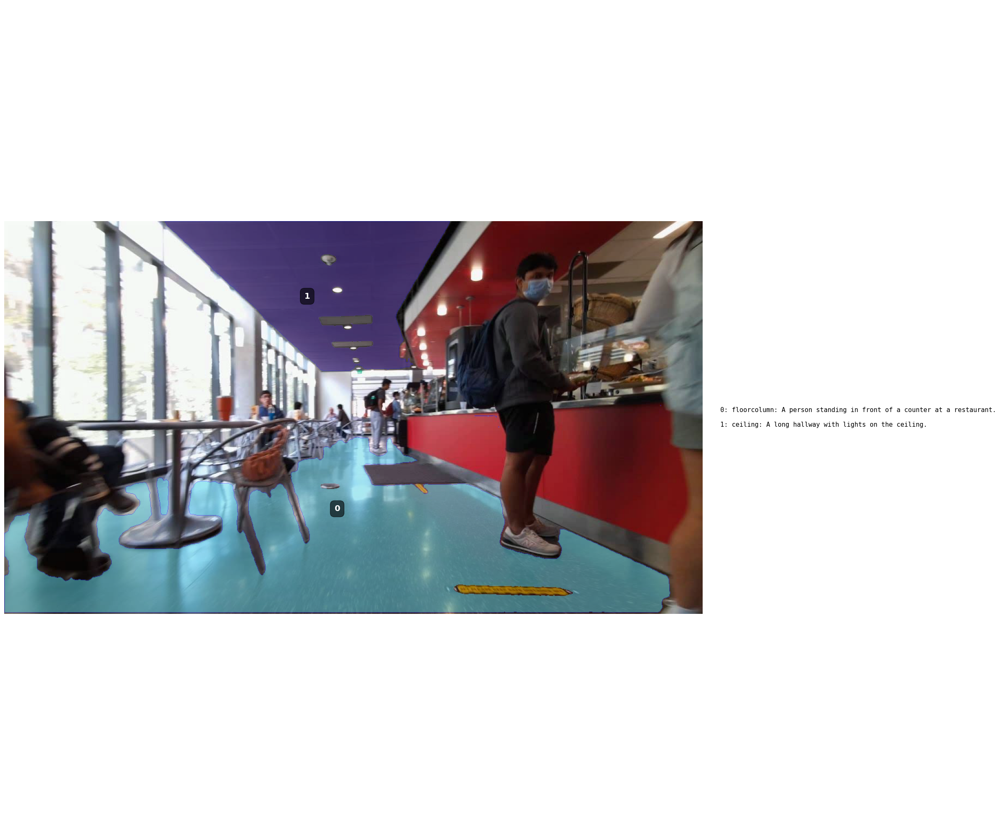


Matching: 1 pairs, Anchors: 3

Processed 6 frames!

ANCHOR SUMMARY
Total anchors: 3
Total observations: 15
Avg observations per anchor: 5.00

Categories:
  ceiling: 1
  floorcolumn: 1
  window: 1

Detailed anchor info:
  Track 0: floorcolumn, 10 obs, frames [4, 4, 5, 5, 6, 7, 7, 7, 8, 9], conf 0.815
    "floorcolumn: A person standing in front of a counter at a restaurant."
  Track 1: ceiling, 4 obs, frames [4, 5, 8, 9], conf 0.909
    "ceiling: A long hallway with lights on the ceiling."
  Track 2: window, 1 obs, frames [7], conf 1.000
    "window: A man sitting in a chair looking out a window."


In [16]:
# Process frames
mask_db = []
anchor_db = create_anchor_db() if ANCHOR_CONFIG['enabled'] else None

# Build processing config
processing_config = {
    'encoder': ENCODER_CONFIG['type'],
    'use_florence': FLORENCE_CONFIG['use_florence'],
    'use_zero_shot': ZERO_SHOT_CONFIG['use_zero_shot'] and ENCODER_CONFIG['type'] == 'naradio',
    'zero_shot_labels': ZERO_SHOT_CONFIG['labels'],
    'use_batch': PROCESSING_CONFIG['use_batch'],
    'batch_size': PROCESSING_CONFIG['batch_size'],
}

# Build models dict
models = {
    'florence_model': florence_model,
    'florence_processor': florence_processor,
    'florence_device': device,
    'visual_encoder': visual_encoder,
    'visual_processor': visual_processor,
    'visual_device': visual_device,
}

# Apply start_frame and max_frames
start_idx = DATA_CONFIG['start_frame']
end_idx = start_idx + DATA_CONFIG['max_frames']
frames_to_process = frames[start_idx:end_idx]

print(f"Processing frames {start_idx} to {end_idx - 1} (total: {len(frames_to_process)} frames)")
print(f"Anchor tracking: {'ENABLED' if ANCHOR_CONFIG['enabled'] else 'DISABLED'}")

for frame_idx, frame_path in enumerate(frames_to_process):
    abs_frame_idx = start_idx + frame_idx
    
    print(f"\n{'='*60}")
    print(f"Processing frame {abs_frame_idx}: {frame_path.name}")
    print(f"{'='*60}")
    
    # Load image
    image = Image.open(frame_path).convert("RGB")
    
    # Display image
    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Frame {abs_frame_idx}: {frame_path.name}")
    plt.show()
    
    # Generate masks
    print("Generating masks...")
    masks = mask_generator.generate(np.array(image))
    print(f"Generated {len(masks)} masks")
    
    # Display masks
    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    show_anns(masks)
    plt.axis('off')
    plt.title(f"SAM Masks ({len(masks)} objects)")
    plt.show()
    
    # Process masks with features
    masks = process_masks_with_features(image, masks, processing_config, models)
    
    # Filter masks by category and size
    masks = filter_masks(masks, image.size, FILTER_CONFIG)
    
    # Visualize with descriptions
    visualize_masks_with_descriptions(image, masks)
    
    # === ANCHOR-BASED TRACKING ===
    if ANCHOR_CONFIG['enabled']:
        if len(mask_db) >= 1:
            # Extract embeddings from previous and current frames
            prev_masks = mask_db[-1][1]
            prev_embeddings = np.array([m['embedding'] for m in prev_masks])
            curr_embeddings = np.array([m['embedding'] for m in masks])
            
            # Run matching between adjacent frames
            if MATCHING_CONFIG['algorithm'] == 'hungarian':
                matches = optimal_match_objects(
                    prev_embeddings, curr_embeddings,
                    threshold=MATCHING_CONFIG['threshold']
                )
            else:
                matches = greedy_match_objects(
                    prev_embeddings, curr_embeddings,
                    threshold=MATCHING_CONFIG['threshold']
                )
            
            # Update anchors with current frame
            update_anchors(
                anchor_db, 
                abs_frame_idx, 
                masks, 
                prev_masks, 
                matches,
                threshold=ANCHOR_CONFIG['threshold'],
                averaging_method=ANCHOR_CONFIG['averaging_method'],
                ema_alpha=ANCHOR_CONFIG['ema_alpha']
            )
            
            print(f"\nMatching: {len(matches)} pairs, Anchors: {len(anchor_db['anchors'])}")
        else:
            # First frame - initialize anchors
            update_anchors(
                anchor_db,
                abs_frame_idx,
                masks,
                None,
                [],
                threshold=ANCHOR_CONFIG['threshold'],
                averaging_method=ANCHOR_CONFIG['averaging_method'],
                ema_alpha=ANCHOR_CONFIG['ema_alpha']
            )
            print(f"\nFirst frame: {len(masks)} anchors initialized")
    
    # Save to database
    mask_db.append((frame_path.name, masks))

print(f"\nProcessed {len(mask_db)} frames!")

# Print anchor summary
if ANCHOR_CONFIG['enabled']:
    anchor_summary = get_anchor_summary(anchor_db)
    print(f"\n{'='*60}")
    print("ANCHOR SUMMARY")
    print(f"{'='*60}")
    print(f"Total anchors: {anchor_summary['n_anchors']}")
    print(f"Total observations: {anchor_summary['total_observations']}")
    print(f"Avg observations per anchor: {anchor_summary['avg_observations_per_anchor']:.2f}")
    print(f"\nCategories:")
    for cat, count in sorted(anchor_summary['categories'].items()):
        print(f"  {cat}: {count}")
    
    print(f"\nDetailed anchor info:")
    for track_id in sorted(anchor_summary['track_ids']):
        anchor = anchor_db['anchors'][track_id]
        print(f"  Track {track_id}: {anchor['category']}, "
              f"{anchor['n_observations']} obs, "
              f"frames {anchor['frames']}, "
              f"conf {anchor['avg_confidence']:.3f}")
        print(f"    \"{anchor['descriptions'][-1]}\"")  # Latest description

## 5. Object Matching & Tracking


DETAILED RESULTS FOR LAST FRAME PAIR
Frame 4: 2 objects
Frame 5: 2 objects
Embedding dimension: 768

HUNGARIAN MATCHING RESULTS:
Matches found: 1
Average similarity: 0.890
Match rate: 0.500
Spatial consistency: 0.000
Average displacement: 339.8 px
Confidence score: 0.634
Unmatched frame0: 1, frame1: 1

Matches with track IDs:
  Frame[-2][0] (track 1) -> Frame[-1][1] (track 1): 0.890
    'ceiling: A blurry image of a person standing in a room.' -> 'ceiling: A long hallway with lights on the ceiling.'


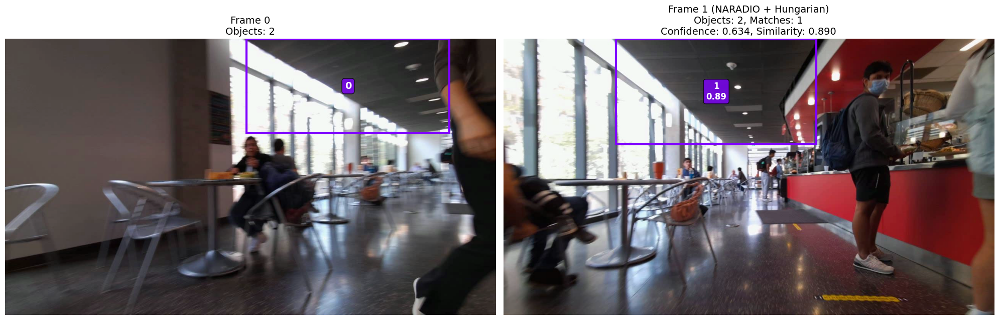

In [17]:
if len(mask_db) >= 2:
    # Show detailed results for the last pair of frames
    print(f"\n{'='*60}")
    print(f"DETAILED RESULTS FOR LAST FRAME PAIR")
    print(f"{'='*60}")
    
    # Extract embeddings from last 2 frames
    frame0_embeddings = np.array([mask['embedding'] for mask in mask_db[-2][1]])
    frame1_embeddings = np.array([mask['embedding'] for mask in mask_db[-1][1]])
    
    frame0_bboxes = [m['bbox'] for m in mask_db[-2][1]]
    frame1_bboxes = [m['bbox'] for m in mask_db[-1][1]]
    
    print(f"Frame {len(mask_db)-2}: {len(frame0_embeddings)} objects")
    print(f"Frame {len(mask_db)-1}: {len(frame1_embeddings)} objects")
    print(f"Embedding dimension: {frame0_embeddings.shape[1]}")
    
    # Run matching
    if MATCHING_CONFIG['algorithm'] == 'hungarian':
        matches = optimal_match_objects(
            frame0_embeddings, frame1_embeddings,
            threshold=MATCHING_CONFIG['threshold']
        )
    else:
        matches = greedy_match_objects(
            frame0_embeddings, frame1_embeddings,
            threshold=MATCHING_CONFIG['threshold']
        )
    
    # Compute metrics
    metrics = compute_unsupervised_metrics(
        matches, frame0_embeddings, frame1_embeddings,
        frame0_bboxes, frame1_bboxes
    )
    
    # Print results
    print(f"\n{MATCHING_CONFIG['algorithm'].upper()} MATCHING RESULTS:")
    print(f"Matches found: {metrics['n_matches']}")
    print(f"Average similarity: {metrics['avg_similarity']:.3f}")
    print(f"Match rate: {metrics['match_rate']:.3f}")
    print(f"Spatial consistency: {metrics['spatial_consistency']:.3f}")
    print(f"Average displacement: {metrics['avg_displacement']:.1f} px")
    print(f"Confidence score: {metrics['confidence_score']:.3f}")
    print(f"Unmatched frame0: {metrics['unmatched_f0']}, frame1: {metrics['unmatched_f1']}")
    
    print(f"\nMatches with track IDs:")
    for i, j, sim in matches:
        track_id_0 = mask_db[-2][1][i].get('track_id', 'N/A')
        track_id_1 = mask_db[-1][1][j].get('track_id', 'N/A')
        print(f"  Frame[-2][{i}] (track {track_id_0}) -> Frame[-1][{j}] (track {track_id_1}): {sim:.3f}")
        print(f"    '{mask_db[-2][1][i]['description']}' -> '{mask_db[-1][1][j]['description']}'")
    
    # Visualize tracking
    frame0_idx = start_idx + len(mask_db) - 2
    frame1_idx = start_idx + len(mask_db) - 1
    image0 = Image.open(frames[frame0_idx]).convert("RGB")
    image1 = Image.open(frames[frame1_idx]).convert("RGB")
    
    visualize_object_tracking_with_metrics(
        image0, mask_db[-2][1],
        image1, mask_db[-1][1],
        matches, metrics,
        title_suffix=f"({ENCODER_CONFIG['type'].upper()} + {MATCHING_CONFIG['algorithm'].capitalize()})"
    )
else:
    print("Need at least 2 frames for tracking!")

## 6. Export Anchors for Knowledge Graph

In [18]:
if ANCHOR_CONFIG['enabled']:
    # Export anchors for knowledge graph construction
    graph_nodes = export_anchors_for_graph(anchor_db, min_observations=2)
    
    print(f"Exported {len(graph_nodes)} anchors for knowledge graph")
    print(f"(filtered: min_observations >= 2)")
    
    # Display sample
    if graph_nodes:
        print(f"\nSample anchors:")
        for node in graph_nodes[:5]:
            print(f"  ID {node['id']}: {node['type']}")
            print(f"    Observations: {node['observations']}, Confidence: {node['confidence']:.3f}")
            print(f"    Frames: {node['frames']}")
            print(f"    Description: \"{node['description']}\"")
    
    # Save to file (optional)
    import json
    output_path = projectDir / "src/output/anchors_export.json"
    with open(output_path, 'w') as f:
        json.dump(graph_nodes, f, indent=2)
    print(f"\nSaved anchors to: {output_path}")
    
    # Save databases for anchor_viewer.ipynb
    import pickle
    anchor_db_path = projectDir / "src/output/anchor_db.pkl"
    mask_db_path = projectDir / "src/output/mask_db.pkl"
    
    with open(anchor_db_path, 'wb') as f:
        pickle.dump(anchor_db, f)
    with open(mask_db_path, 'wb') as f:
        pickle.dump(mask_db, f)
    
    print(f"\nSaved for viewer:")
    print(f"  {anchor_db_path}")
    print(f"  {mask_db_path}")
    print(f"\nNow you can use anchor_viewer.ipynb to browse anchors!")
else:
    print("Anchor tracking is disabled. Enable ANCHOR_CONFIG['enabled'] = True to export.")

Exported 2 anchors for knowledge graph
(filtered: min_observations >= 2)

Sample anchors:
  ID 0: floorcolumn
    Observations: 10, Confidence: 0.815
    Frames: [4, 4, 5, 5, 6, 7, 7, 7, 8, 9]
    Description: "floorcolumn: A person standing in front of a counter at a restaurant."
  ID 1: ceiling
    Observations: 4, Confidence: 0.909
    Frames: [4, 5, 8, 9]
    Description: "ceiling: A long hallway with lights on the ceiling."

Saved anchors to: /home/denis_fatykhov/Projects/vizEnc/src/output/anchors_export.json

Saved for viewer:
  /home/denis_fatykhov/Projects/vizEnc/src/output/anchor_db.pkl
  /home/denis_fatykhov/Projects/vizEnc/src/output/mask_db.pkl

Now you can use anchor_viewer.ipynb to browse anchors!


## Summary

All done! You now have a complete **anchor-based tracking system** for building knowledge graphs:

### Key Features:
- **Anchor-based tracking**: Objects accumulate observations across frames
- **Dual averaging methods**: Choose between 'mean' or 'ema' for embedding updates
- **Re-identification**: Objects can be recovered after occlusions
- **Knowledge graph export**: Ready-to-use JSON format for graph construction

### Configuration:
- Change settings in the **Configuration** cell
- Toggle anchors with `ANCHOR_CONFIG['enabled']`
- Switch averaging: `ANCHOR_CONFIG['averaging_method']` = 'mean' or 'ema'
- Adjust frame range: `DATA_CONFIG['start_frame']` and `max_frames`

### Access Anchor Data:
```python
# Get anchor by track ID
anchor = anchor_db['anchors'][track_id]
# Keys: embedding, embeddings_history, frames, bboxes, descriptions, 
#       category, first_seen, last_seen, n_observations, avg_confidence

# Export for knowledge graph
graph_nodes = export_anchors_for_graph(anchor_db, min_observations=2)
# Saved to: anchors_export.json
```